In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# 지드라이브로 데이터 연결
from google.colab import drive
drive.mount('/content/drive')

data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/stroke-data.csv')
data.head(5)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [3]:
# 데이터 읽기
# data=pd.read_csv('../content/stroke-data.csv')
# data.head(5)

# Data Preprocessing

In [4]:
# 데이터 전반적인 정보 확인
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [5]:
# 데이터 컬럼명 확인
data.columns

Index(['id', 'gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')

In [6]:
data.drop(columns=['id'],inplace=True)
data.head(10)

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1
6,Male,74.0,1,1,Yes,Private,Rural,70.09,27.4,never smoked,1
7,Female,69.0,0,0,No,Private,Urban,94.39,22.8,never smoked,1
8,Female,59.0,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
9,Female,78.0,0,0,Yes,Private,Urban,58.57,24.2,Unknown,1


In [7]:
#결손값 있는지 확인
print(data.isnull().any(axis=0))
print(data.isnull().any(axis=1))

gender               False
age                  False
hypertension         False
heart_disease        False
ever_married         False
work_type            False
Residence_type       False
avg_glucose_level    False
bmi                   True
smoking_status       False
stroke               False
dtype: bool
0       False
1        True
2       False
3       False
4       False
        ...  
5105     True
5106    False
5107    False
5108    False
5109    False
Length: 5110, dtype: bool


In [8]:
# 데이터 통계량 확인하기
data.describe()

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


In [9]:
# 결손값 찾아서 비율이 어느 정도 되는지 보여주는 함수 정의
def draw_missing_data_table(data):
    total = data.isnull().sum().sort_values(ascending=False)
    percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    return missing_data
draw_missing_data_table(data)

,Total,Percent
bmi,201,0.039335
gender,0,0.000000
age,0,0.000000
hypertension,0,0.000000
heart_disease,0,0.000000
ever_married,0,0.000000
work_type,0,0.000000
Residence_type,0,0.000000
avg_glucose_level,0,0.000000
smoking_status,0,0.000000


In [10]:
# Imputing the missing values with the mean
data=data.fillna(np.mean(data['bmi']))
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             5110 non-null   object 
 1   age                5110 non-null   float64
 2   hypertension       5110 non-null   int64  
 3   heart_disease      5110 non-null   int64  
 4   ever_married       5110 non-null   object 
 5   work_type          5110 non-null   object 
 6   Residence_type     5110 non-null   object 
 7   avg_glucose_level  5110 non-null   float64
 8   bmi                5110 non-null   float64
 9   smoking_status     5110 non-null   object 
 10  stroke             5110 non-null   int64  
dtypes: float64(3), int64(3), object(5)
memory usage: 439.3+ KB


In [11]:
# 성별, 주거타입, 기혼여부 0과 1로 변환
data['gender']=data['gender'].apply(lambda x : 1 if x=='Male' else 0)
data["Residence_type"] = data["Residence_type"].apply(lambda x: 1 if x=="Urban" else 0)
data["ever_married"] = data["ever_married"].apply(lambda x: 1 if x=="Yes" else 0)
data.head(5)

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,67.0,0,1,1,Private,1,228.69,36.600000,formerly smoked,1
1,0,61.0,0,0,1,Self-employed,0,202.21,28.893237,never smoked,1
2,1,80.0,0,1,1,Private,0,105.92,32.500000,never smoked,1
3,0,49.0,0,0,1,Private,1,171.23,34.400000,smokes,1
4,0,79.0,1,0,1,Self-employed,0,174.12,24.000000,never smoked,1


In [12]:
# Removing the observations that have smoking type unknown.
#data=data[data['smoking_status']!='Unknown']
#data.info()

In [13]:
# One Hot encoding smoking_status, work_type
data_dummies = data[['smoking_status','work_type']]
data_dummies=pd.get_dummies(data_dummies)
data.drop(columns=['smoking_status','work_type'],inplace=True)

In [14]:
data_stroke=data['stroke']
data.drop(columns=['stroke'],inplace=True)
data=data.merge(data_dummies,left_index=True, right_index=True,how='left')

In [15]:
data.head(5)

,gender,age,hypertension,heart_disease,ever_married,Residence_type,avg_glucose_level,bmi,smoking_status_Unknown,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes,work_type_Govt_job,work_type_Never_worked,work_type_Private,work_type_Self-employed,work_type_children
0,1,67.0,0,1,1,1,228.69,36.600000,0,1,0,0,0,0,1,0,0
1,0,61.0,0,0,1,0,202.21,28.893237,0,0,1,0,0,0,0,1,0
2,1,80.0,0,1,1,0,105.92,32.500000,0,0,1,0,0,0,1,0,0
3,0,49.0,0,0,1,1,171.23,34.400000,0,0,0,1,0,0,1,0,0
4,0,79.0,1,0,1,0,174.12,24.000000,0,0,1,0,0,0,0,1,0


In [36]:
#학습 데이터와 테스트 데이터로 분리
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(data,data_stroke,test_size=0.25,random_state=0)

print('Train data: ', x_train.shape)
print('Train data: ', x_test.shape)

Train data:  (3832, 17)
Train data:  (1278, 17)


In [37]:
# 데이터 스케일링 : 표준정규화
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
print('레이블 0인 Train data: ', sum(y_train==0))
print('레이블 1인 Train data: ', sum(y_train==1))

레이블 0인 Train data:  3648
레이블 1인 Train data:  184


In [49]:
"""
# 불균형 데이터 처리 : SMOTE로 Sampling
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=4)
x_train, y_train = sm.fit_resample(x_train, y_train.ravel())

print('레이블 0인 Train data: ', sum(y_train==0))
print('레이블 1인 Train data: ', sum(y_train==1))
"""

"\n# 불균형 데이터 처리 : SMOTE로 Sampling\nfrom imblearn.over_sampling import SMOTE\nsm = SMOTE(random_state=4)\nx_train, y_train = sm.fit_resample(x_train, y_train.ravel())\n\nprint('레이블 0인 Train data: ', sum(y_train==0))\nprint('레이블 1인 Train data: ', sum(y_train==1))\n"

# 2. Logistic Regression

In [54]:
#필요한 라이브러리 추가
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [55]:
#로지스틱회귀모델 객체 생성
lr = LogisticRegression()
lr.fit(x_train,y_train)
prediction = lr.predict(x_test)

In [56]:
train_score = lr.score(x_train, y_train)
test_score = lr.score(x_test, y_test)
print('Train Score \n',train_score)
print('Test Score \n',test_score)

Train Score 
 0.8009868421052632
Test Score 
 0.7629107981220657


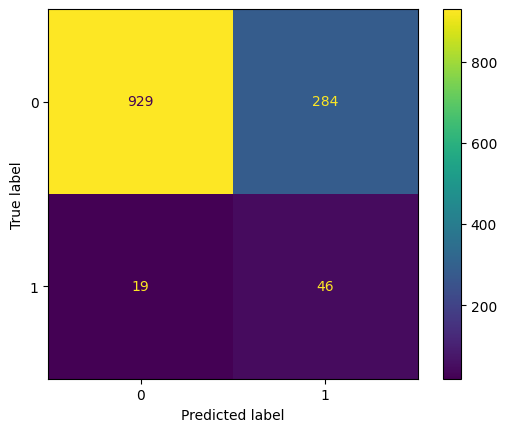

In [57]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
cm = confusion_matrix(y_test,prediction)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

# 3. Decision Tree

In [59]:
#의사결정트리 객체 생성
from sklearn.tree import DecisionTreeClassifier

dt= DecisionTreeClassifier()
dt.fit(x_train,y_train)
prediction = dt.predict(x_test)

In [60]:
train_score = dt.score(x_train, y_train)
test_score = dt.score(x_test, y_test)
print('Train Score \n',train_score)
print('Test Score \n',test_score)

Train Score 
 1.0
Test Score 
 0.8794992175273866


In [63]:
from sklearn.tree import export_graphviz

# export_graphviz()함수를 이용하여 out_file로 지정된 tree.dot 파일을 생성함.
X = data.iloc[:,0:17]
y = data.iloc[:,-1]
x_list = list(X.columns)
y_list = list(y.drop_duplicates(inplace=False))
class_names = [str(cls) for cls in y_list]

export_graphviz(dt, out_file="tree.dot", feature_names=x_list, class_names=class_names, filled=True, rounded=True, special_characters=True)


In [67]:
import graphviz
import pydotplus
from IPython.display import Image

# 위에서 생성된 tree.dot 파일을 Graphviz 읽어서 Jupyter Notebook상에서 시각화
with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

graph = pydotplus.graph_from_dot_data(dot_graph)
Image(graph.create_png())

In [65]:
dt1= DecisionTreeClassifier(criterion='entropy', max_depth=5)
dt1.fit(x_train,y_train)
prediction = dt1.predict(x_test)
train_score = dt1.score(x_train, y_train)
test_score = dt1.score(x_test, y_test)
print('Train Score \n',train_score)
print('Test Score \n',test_score)

Train Score 
 0.8353892543859649
Test Score 
 0.7785602503912363


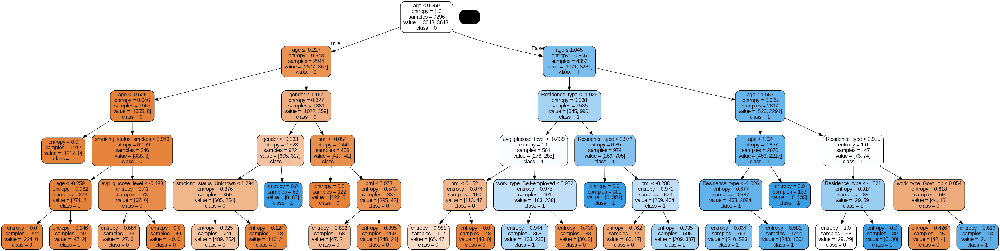

In [68]:
export_graphviz(dt1, out_file="tree.dot", feature_names=x_list, class_names=class_names, filled=True, rounded=True, special_characters=True)

import graphviz
import pydotplus
from IPython.display import Image

# 위에서 생성된 tree.dot 파일을 Graphviz 읽어서 Jupyter Notebook상에서 시각화
with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

graph = pydotplus.graph_from_dot_data(dot_graph)
Image(graph.create_png())

In [69]:
dt2= DecisionTreeClassifier(max_depth=6, min_samples_split=5)
dt2.fit(x_train,y_train)
prediction = dt2.predict(x_test)
train_score = dt2.score(x_train, y_train)
test_score = dt2.score(x_test, y_test)
print('Train Score \n',train_score)
print('Test Score \n',test_score)

Train Score 
 0.8381304824561403
Test Score 
 0.7738654147104851


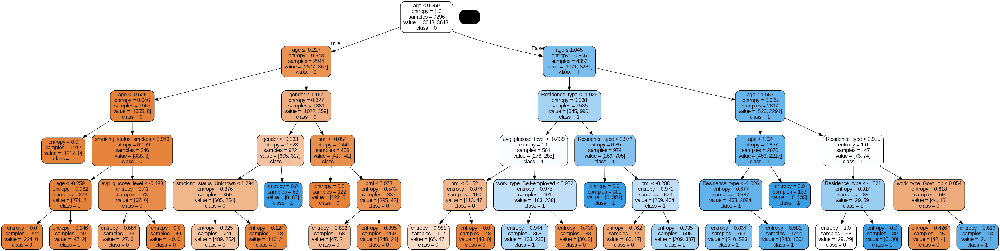

In [70]:
import graphviz
import pydotplus
from IPython.display import Image

# 위에서 생성된 tree.dot 파일을 Graphviz 읽어서 Jupyter Notebook상에서 시각화
with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

graph = pydotplus.graph_from_dot_data(dot_graph)
Image(graph.create_png())